<a href="https://colab.research.google.com/github/fatemehmahdavi/MachineLearningModels/blob/main/Magic.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler
from imblearn.over_sampling import RandomOverSampler

**Dataset**:
Original Owner:

R. K. Bock
Major Atmospheric Gamma Imaging Cherenkov Telescope project (MAGIC)
http://wwwmagic.mppmu.mpg.de
rkb '@' mail.cern.ch

Donor:

P. Savicky
Institute of Computer Science, AS of CR
Czech Republic
savicky '@' cs.cas.cz

In [ ]:
cols = ["fLength", "fWidth", "fSize", "fConc", "fConc1", "fAsym", "fM3Long", "fM3Trans", "fAlpha", "fDist", "class"]
df = pd.read_csv("magic04.data",names=cols) #read csv file and turn it into a pandas dataframe object
df.head() #first five entries

,fLength,fWidth,fSize,fConc,fConc1,fAsym,fM3Long,fM3Trans,fAlpha,fDist,class
0,28.7967,16.0021,2.6449,0.3918,0.1982,27.7004,22.0110,-8.2027,40.0920,81.8828,g
1,31.6036,11.7235,2.5185,0.5303,0.3773,26.2722,23.8238,-9.9574,6.3609,205.2610,g
2,162.0520,136.0310,4.0612,0.0374,0.0187,116.7410,-64.8580,-45.2160,76.9600,256.7880,g
3,23.8172,9.5728,2.3385,0.6147,0.3922,27.2107,-6.4633,-7.1513,10.4490,116.7370,g
4,75.1362,30.9205,3.1611,0.3168,0.1832,-5.5277,28.5525,21.8393,4.6480,356.4620,g


In [ ]:
#df["class"].unique() #g=gamma h=hadrone
df["class"] = (df["class"] == 'g').astype(int) #convert g and h to 1 and 0 because our computer understands 0 and 1

**types of ML**:

*   **supervisied learning** uses labeled inputs to train models and learn outputs,
 
*   **unsupervisied learning** uses unlabeled inputs to learn about patterns in data,
*   **reinforcement learning** = agent learning in an interactive environment based on rewards and penalties



inputs=feature vector

one row of dataset= a feature vector

types of features:

qualitative
quantitative

**types of qualitative data**:



*   nominal data

*   ordinal data



**qualitative**=categorical data(finite number of categories or groups), like gender or nationality 
qualitative data has no inherent order and is **nominal data**(cannot say us=1 france 2,....)

**one-hot encoding**= if the input matches a certain category make it 1 if it doesn't make it 0,
example: usa [1,0,0] canada [0,1,0] India [0,0,1]

ordinal data has inherent ordering system , like ratings or age groups
rating bad =1 good=2 great=3

quantitative data = numerical valued (discrete or continous) , like length, temprerature

**types of prediction(output):**



*   supervisied learning tasks:


> classification=predict discrete classes

> types of classification:

> multi , like cat/dog/shark   orange/apple/pear
> binary = two categories , like positive/negative spam/non-spam





*   regression= predict continous values(a number as closeset to the true value as possible using different features of dataset) , like predicting the temprerature or price of a house


**supervisied learning dataset:**

each row in the dataset =different sample
each column in the dataset= different feature

target/output for feature vector= what we're trying to predict

features matrix=x
labels/targets vector=y

we can compare the predcited outcome with the true value in supervisied learning so we can make adjustments so that in the next iteration we get closer to the true value,this is called **training**

break dataset into three different parts:
training dataset 60% 80%
validation dataset 20% 10%
testing dataset 20%    10%

**loss**=difference between prediction and true value

**validation set** used as reality checker during or after tarining to ensure model can hndle unseen data

**we don't have the training step when we feed the validation set to our model, there's no feedback loop and our loss never gets fed back to the model

model with lower loss= better model

training **bold text** = test set used as to check how generalizable our final chosen model is and we have the final reported performance of model with the dataset that our model has never seen before at any point during the training process

**Loss Functions:**

L1 loss:

loss=sum(|y real- y predicted|)

L2 loss:

loss=sum(y real- y predicted)**2

Binary cross-entropy loss used for binary classification, the loss decreaces as the performance gets better

Accuracy e.g. we feed three pictures to our model 

predictions            actual values

apple                   apple

orange                  orange

apple                   orange

accuracy=2/3 or 60%


In [ ]:
df.head()

,fLength,fWidth,fSize,fConc,fConc1,fAsym,fM3Long,fM3Trans,fAlpha,fDist,class
0,28.7967,16.0021,2.6449,0.3918,0.1982,27.7004,22.0110,-8.2027,40.0920,81.8828,1
1,31.6036,11.7235,2.5185,0.5303,0.3773,26.2722,23.8238,-9.9574,6.3609,205.2610,1
2,162.0520,136.0310,4.0612,0.0374,0.0187,116.7410,-64.8580,-45.2160,76.9600,256.7880,1
3,23.8172,9.5728,2.3385,0.6147,0.3922,27.2107,-6.4633,-7.1513,10.4490,116.7370,1
4,75.1362,30.9205,3.1611,0.3168,0.1832,-5.5277,28.5525,21.8393,4.6480,356.4620,1


In [ ]:
for label in cols[:-1]:
  plt.hist(df[df["class"]==1][label], color='blue' , label='gamma', alpha=0.7, density=True) #inside the dataframe get me everything where the class is 1, all the values that belong to class 1 for all labels
  plt.hist(df[df["class"]==0][label], color='red', label='hadrone', alpha=0.7, density=True) #density=true normalizes the distributions, like if you have 200 of one type and 50 of another type it would be hard to compare one of them would be bigger than the other but by normalizing them we are distributing them over how many samples there are
  plt.title(label)
  plt.ylabel("probability") #density
  plt.xlabel(label)
  plt.legend()
  plt.show()

In [ ]:
train, valid, test = np.split(df.sample(frac=1), [int(0.6*len(df)), int(0.8*len(df))])               # sample method of your data frame to sample all rows without replacement,The frac keyword argument specifies the fraction of rows to return in the random sample, so frac=1 means to return all rows (in random order).
                                                                                                  #everything from 60% to 80%=validation dataset, from 805 to 100%=test dataset


In [ ]:
len(train[train["class"]==1]) #gamma
len(train[train["class"]==0]) #hadrone
# the number of samples with class 1 is really bigger than the number of samples with class 2 so we use resample to balance the numbers

4017

In [ ]:
def scale_dataset(dataframe,oversample=False):
  X = dataframe[dataframe.columns[:-1]].values #2D #all features except the class column
  y = dataframe[dataframe.columns[-1]].values  #1D(vector)

  scaler = StandardScaler() #StandardScaler performs the task of Standardization. Usually a dataset contains variables that are different in scale. For e.g. an Employee dataset will contain AGE column with values on scale 20-70 and SALARY column with values on scale 10000-80000.As these two columns are different in scale, they are Standardized to have common scale while building machine learning model.
  X = scaler.fit_transform(X) #https://towardsdatascience.com/what-and-why-behind-fit-transform-vs-transform-in-scikit-learn-78f915cf96fe

  if oversample:
    ros = RandomOverSampler()
    X,y = ros.fit_resample(X,y)  #take more of the samller class and keep sampling from there to increase the size of the dataset of that samller class so that the datasets of two classes match

  #create the whole data as a 2d numpy array
  data = np.hstack((X, np.reshape(y, (-1, 1))))    #stack two arrays and horizontally(next to eachother) stack them together #reshape y into a 2D object
  #reshaping with (-1, 1), then the array will get reshaped in such a way that the resulting array has only 1 column. -1 in reshape(-1) refers to an unknown dimension that the reshape() function calculates for you. 
  return data , X , y

In [ ]:
df[df.columns[:-1]].values 

array([[ 28.7967,  16.0021,   2.6449, ...,  -8.2027,  40.092 ,  81.8828],
       [ 31.6036,  11.7235,   2.5185, ...,  -9.9574,   6.3609, 205.261 ],
       [162.052 , 136.031 ,   4.0612, ..., -45.216 ,  76.96  , 256.788 ],
       ...,
       [ 75.4455,  47.5305,   3.4483, ...,  -9.4662,  30.2987, 256.5166],
       [120.5135,  76.9018,   3.9939, ..., -63.8389,  84.6874, 408.3166],
       [187.1814,  53.0014,   3.2093, ...,  31.4755,  52.731 , 272.3174]])

In [ ]:
train, X_train, y_train = scale_dataset(train, oversample=True)
validation, X_valid, y_valid = scale_dataset(valid, oversample=False)
test, X_test, y_test = scale_dataset(test, oversample=False)
#no oversampling for unseen data,we want to test the model

#kNN

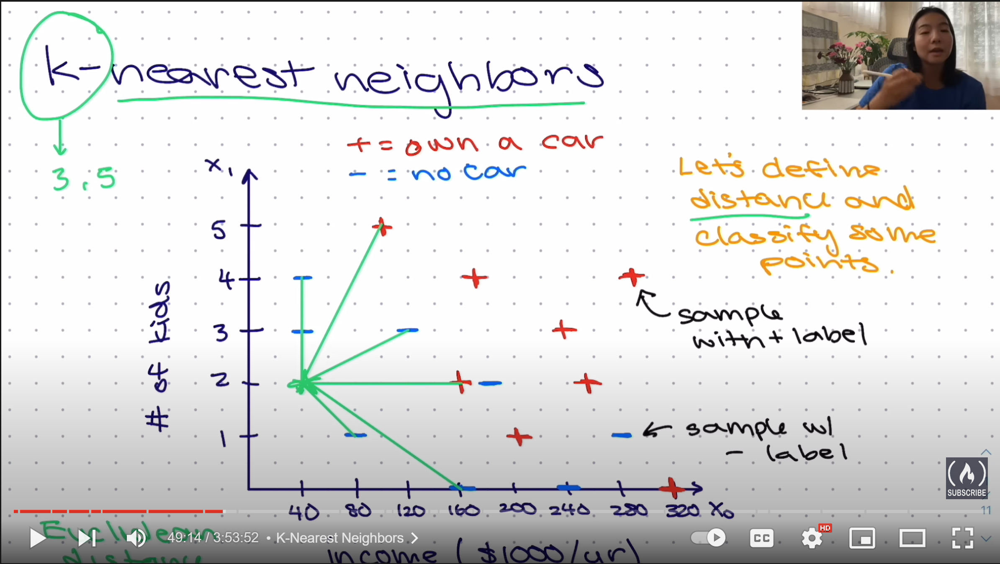



---

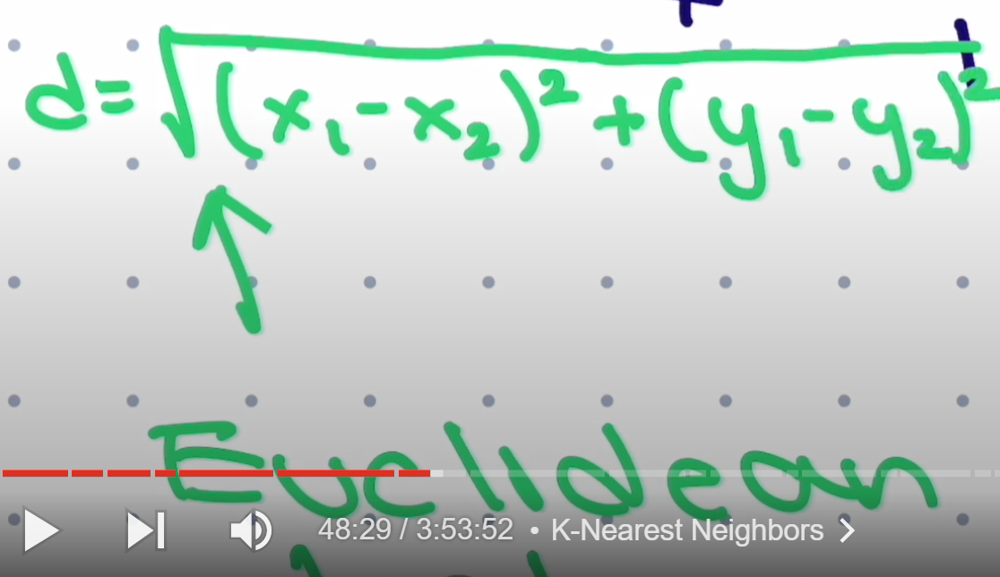

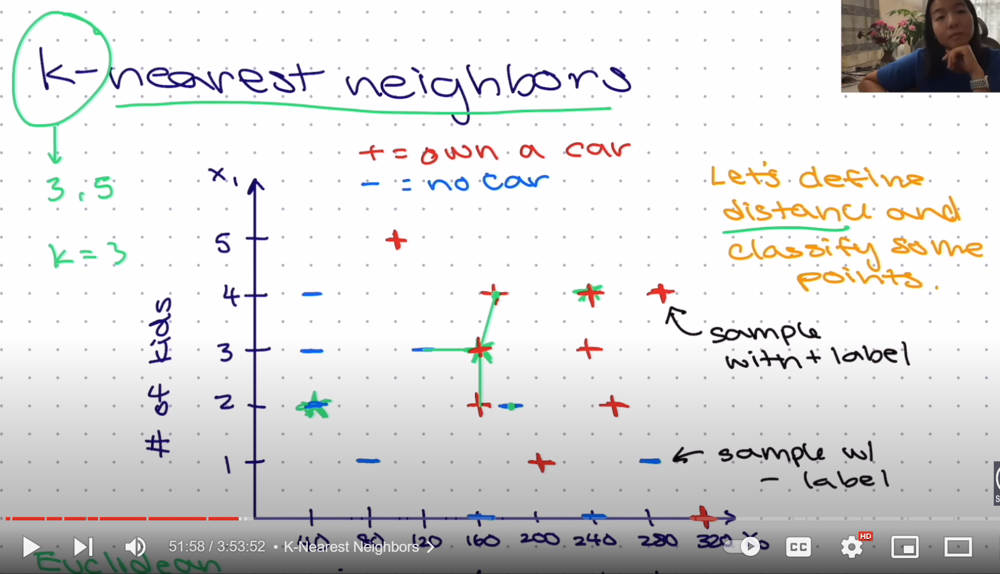

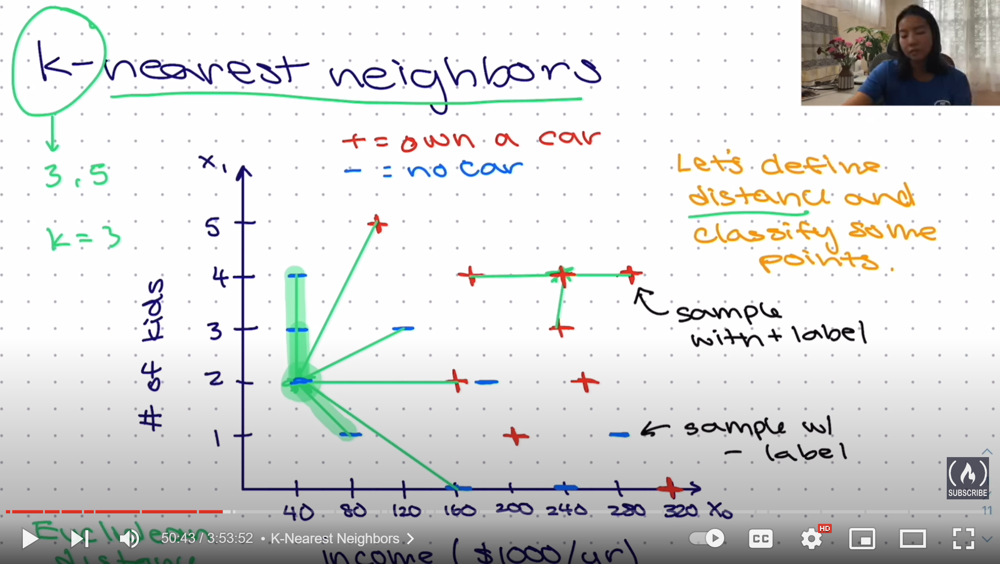

In [ ]:
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import classification_report

In [ ]:
knn_model = KNeighborsClassifier(n_neighbors=5)
knn_model.fit(X_train,y_train)   #https://towardsdatascience.com/fit-vs-predict-vs-fit-predict-in-python-scikit-learn-f15a34a8d39f

KNeighborsClassifier()

In [ ]:
y_pred = knn_model.predict(X_test)

In [ ]:
print(classification_report(y_test,y_pred))  #precision = out of the ones that we've labeled a specific class,how many of them are actually that class
                                             #recall = out of the ones that are actually this class, how many of those did we get right
                                             #f1-score = combination of precision and recall score, we have an unbalanced test dataset so pay more attention to this

              precision    recall  f1-score   support

           0       0.74      0.74      0.74      1336
           1       0.86      0.86      0.86      2468

    accuracy                           0.82      3804
   macro avg       0.80      0.80      0.80      3804
weighted avg       0.82      0.82      0.82      3804



#Naive Bayes

*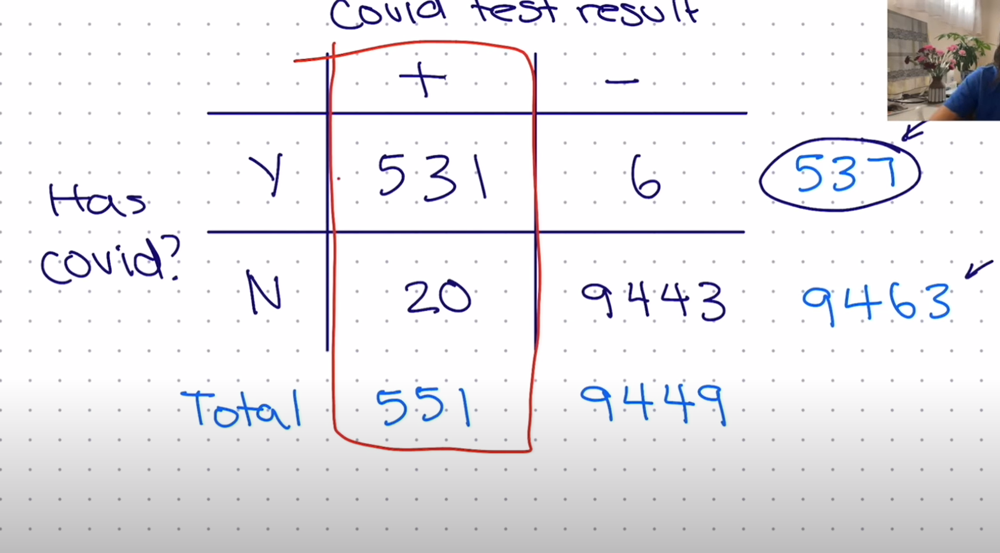*

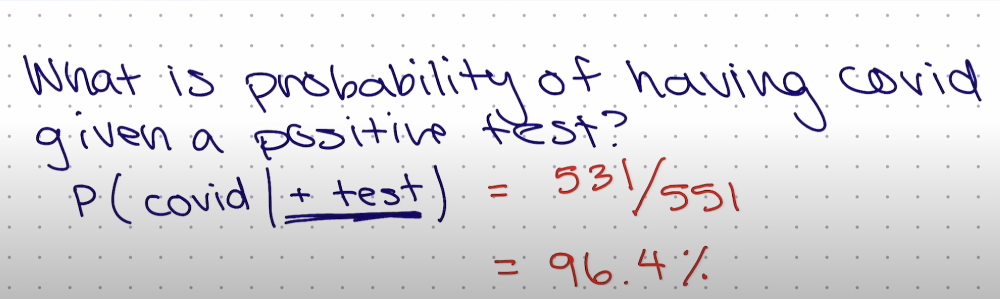



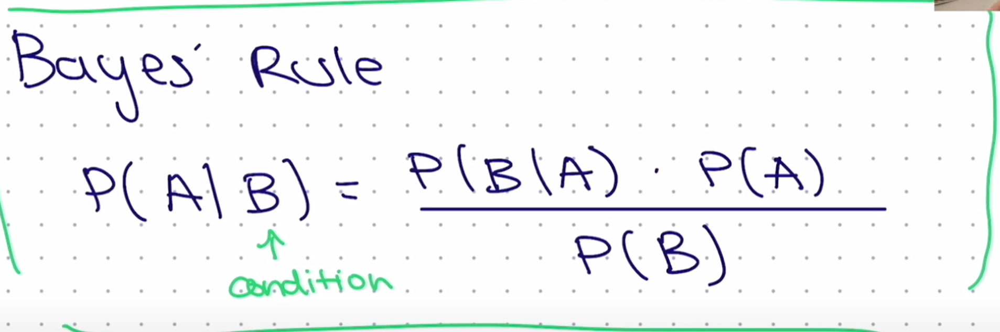



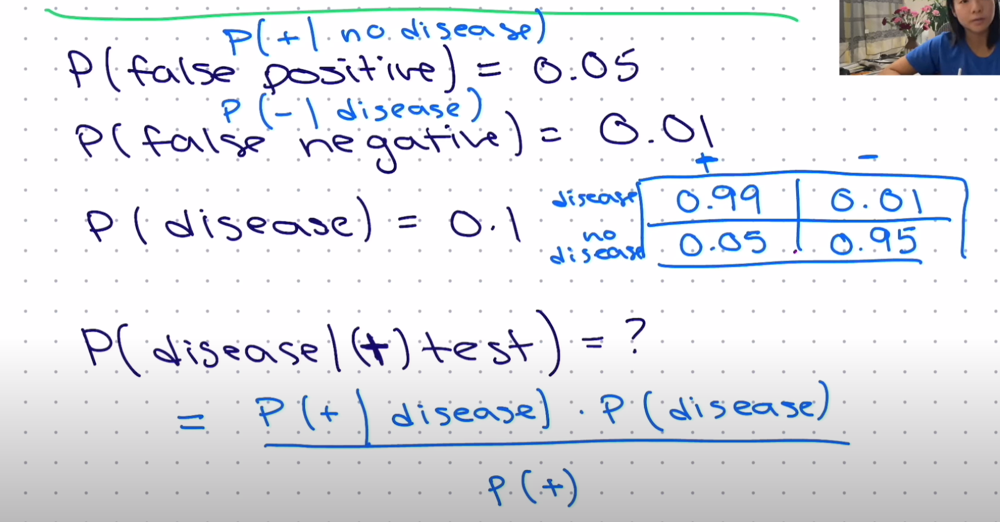



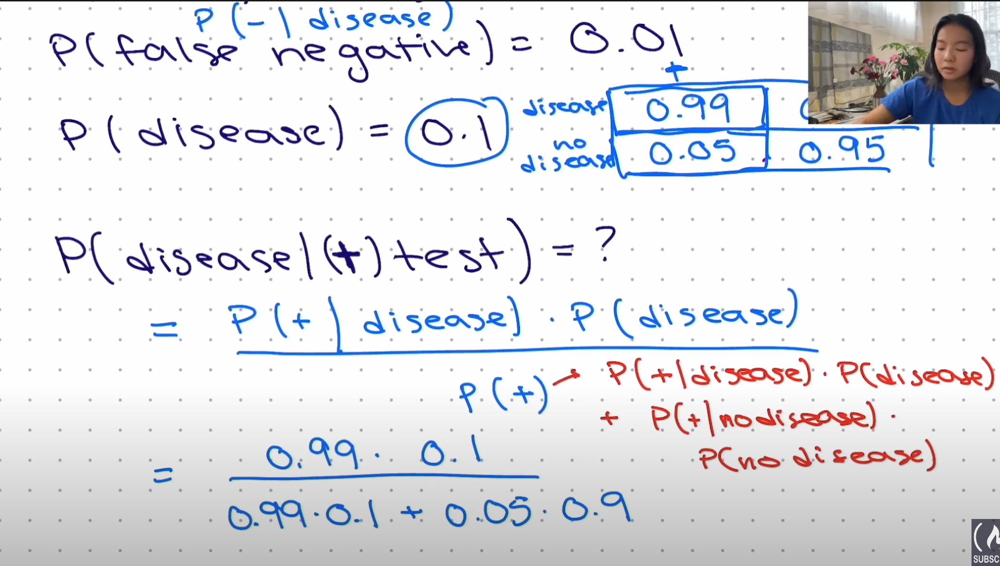



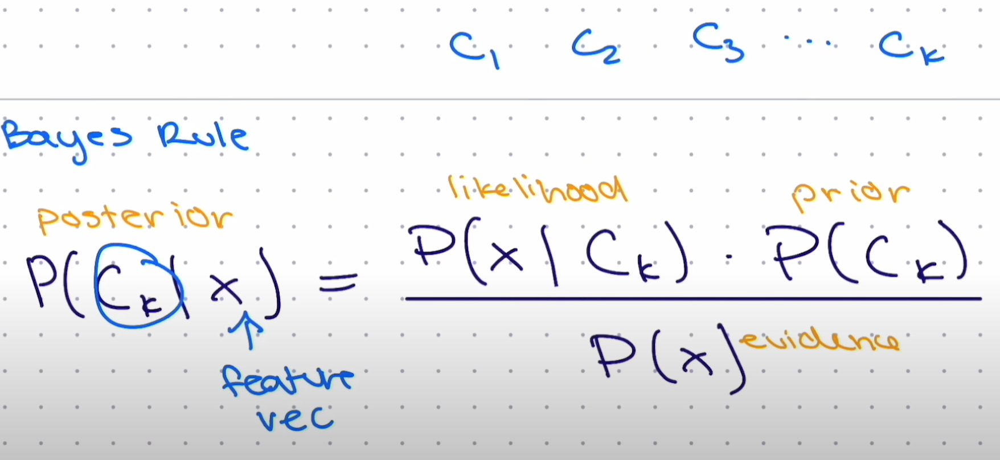

In [ ]:
from sklearn.naive_bayes import GaussianNB

In [ ]:
nb_model = GaussianNB()
nb_model = nb_model.fit(X_train,y_train)

In [ ]:
y_pred=nb_model.predict(X_test)

In [ ]:
print(classification_report(y_test,y_pred)) 

              precision    recall  f1-score   support

           0       0.67      0.40      0.50      1336
           1       0.73      0.89      0.81      2468

    accuracy                           0.72      3804
   macro avg       0.70      0.65      0.65      3804
weighted avg       0.71      0.72      0.70      3804



#LogisticRegression

Fit our data to sigmoid function

In [19]:
from sklearn.linear_model import LogisticRegression

In [20]:
lg_model=LogisticRegression()
lg_model=lg_model.fit(X_test,y_test)

In [22]:
y_pred=lg_model.predict(X_test)
print(classification_report(y_test,y_pred)) 

              precision    recall  f1-score   support

           0       0.76      0.59      0.66      1336
           1       0.80      0.90      0.85      2468

    accuracy                           0.79      3804
   macro avg       0.78      0.74      0.75      3804
weighted avg       0.79      0.79      0.78      3804



#Support Vector Machine(SVM)
our goal:

The line that best seperates the two classes and
Maximize the margins

suport vector =  datapoints that are on the margin lines